In [6]:
!pwd

/kaggle/working


In [7]:
!gdown --folder --fuzzy https://drive.google.com/drive/folders/1_UbQ7x4MK9fZjA-9DqJY_A8nedsg9KMy?usp=sharing

Retrieving folder contents
Retrieving folder 1XRrRB7y66RU4lxZiH7a6H_b8fOvKgOQl Данные
Retrieving folder 1BuZu2mkvf9z2PnUQ5r5MkFW3WDEK0BtD 25_2-10
Processing file 1Sb7Q2WMw18bnDnaQ1l0-IOvzsbZnzmWX 25_2-10.csv
Processing file 1o60Yg-jrfhSTRO3p5MIMnkgnRBfI7Ts- 25_2-10.mp4
Retrieving folder 1F7an7E6acse9piuas8C0oavw1W1YkqrP 25_12-20
Processing file 1EY0-m1tGEKHm2a-vavO3ZoBl-aGFt4Ie 25_12-20.csv
Processing file 1wta2La9lxYuq64EDa1Y9EtCNVAZ82vXU 25_12-20.mp4
Retrieving folder 1-yxvCluKFydS_0CafpK1jZKEs5ylpKns 26_12-20
Processing file 14rjaSkj7WAP4ZSnYaheutu8mC1ipfsF7 26_12-20.csv
Processing file 1BDTRpHBTgdX18mFR_cOiKpD9tvJiQtjD 26_12-20.mp4
Retrieving folder 1SqLNpW54hyfvkszOUxNJfbjnCRxKohP2 43_15
Processing file 1b3tZvQzEMY26N32jpyzPjpnFy4FwnygT 43_15.csv
Processing file 1x4c34HN4WPMI8OhICaldgm1MU0JjRlJR 43_15.mp4
Retrieving folder 1RHmh091ohg2gsyPf5QAlvgoRzWFuoH9a 49_5
Processing file 1NChU4t7d9UMn6F5nxhREwzQbDc97uPDZ 49_5.csv
Processing file 1DO7vFWsB694XMUrqSzDOtWIX97f0Wiwf 49_5.mp4
Ret

In [8]:
working_dir = '/kaggle/working/'
!ls -la {working_dir}

total 20
drwxr-xr-x 5 root root 4096 May 15 15:04  .
drwxr-xr-x 5 root root 4096 May 15 14:58  ..
drwxr-xr-x 4 root root 4096 May 15 15:04  price-tag-detection
drwxr-xr-x 2 root root 4096 May 15 14:59  .virtual_documents
drwxr-xr-x 4 root root 4096 May 15 14:59 'Доступно участникам'


In [9]:
!mkdir -p {working_dir}"/Доступно участникам/Данные/25_12-20/frames"
!ffmpeg -i {working_dir}"/Доступно участникам/Данные/25_12-20/25_12-20.mp4" \
  -qscale:v 2 {working_dir}"/Доступно участникам/Данные/25_12-20/frames/frame_%06d.jpg"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [10]:
import pandas as pd
price_tags = pd.read_csv(f'{working_dir}/Доступно участникам/Данные/25_12-20/25_12-20.csv')

In [11]:
price_tags.iloc[0]

filename                                                      25_12-20/2.mp4
product_name               Напиток безалкогольный SANTO STEFANO Rosso (Ро...
price_default                                                         252,63
price_card                                                            129,99
price_discount                                                           нет
barcode                                                        4670025474665
discount_amount                                                         -48%
id_sku                                                          270207736530
print_datetime                                               03.04.2026 3:08
code                                                                     нет
additional_info                                                          нет
color                                                                    red
special_symbols                                                          нет

In [12]:
import cv2
import os
import pandas as pd
import math

def parse_coord(val):
    if isinstance(val, str):
        val = val.replace(",", ".")  # fix decimal separator
    return int(float(val))

video_path = f"{working_dir}/Доступно участникам/Данные/25_12-20/25_12-20.mp4"
frames_dir = f"{working_dir}/Доступно участникам/Данные/25_12-20/frames"
output_dir = f"{working_dir}/Доступно участникам/Данные/25_12-20/crops"
csv_path = f"{working_dir}/Доступно участникам/Данные/25_12-20/25_12-20.csv"

os.makedirs(output_dir, exist_ok=True)

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
cap.release()

df = pd.read_csv(csv_path)

for _, row in df.iterrows():
    ts = float(row["frame_timestamp"])  # seconds

    frame_id = int(math.floor(ts * fps)) + 1
    frame_name = f"frame_{frame_id:06d}.jpg"
    
    frame_path = os.path.join(frames_dir, frame_name)

    print(frame_path)

    if not os.path.exists(frame_path):
        continue

    img = cv2.imread(frame_path)

    x1, y1 = parse_coord(row["x_min"]), parse_coord(row["y_min"])
    x2, y2 = parse_coord(row["x_max"]), parse_coord(row["y_max"])

    h, w = img.shape[:2]
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(w, x2), min(h, y2)

    crop = img[y1:y2, x1:x2]

    out_name = f"{frame_id:06d}_{row['id_sku']}.jpg"

    out_path = os.path.join(output_dir, out_name)

    crop = cv2.rotate(crop, cv2.ROTATE_90_COUNTERCLOCKWISE)

    print(f"saved to {out_path}")
    cv2.imwrite(out_path, crop)

/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
saved to /kaggle/working//Доступно участникам/Данные/25_12-20/crops/000001_270207736530.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
saved to /kaggle/working//Доступно участникам/Данные/25_12-20/crops/000001_270207736529.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
saved to /kaggle/working//Доступно участникам/Данные/25_12-20/crops/000001_270207716055.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
saved to /kaggle/working//Доступно участникам/Данные/25_12-20/crops/000001_270207716056.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_112476.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
saved to /kaggle/working//Доступно участникам/Данные/25_12-20/crops/000001_270122736635.jpg
/kaggle/working//Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg
s

### Detection

In [5]:
!git clone https://huggingface.co/openfoodfacts/price-tag-detection

fatal: destination path 'price-tag-detection' already exists and is not an empty directory.


In [14]:
!pip list | grep ultralytics

In [15]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.2 MB/s eta 0:00:0000:0100:01


In [27]:
import cv2
from ultralytics import YOLO

model = YOLO("/kaggle/working/price-tag-detection/weights/best.pt")

image_path = "/kaggle/working/Доступно участникам/Данные/25_12-20/frames/frame_000001.jpg"

img = cv2.imread(image_path)

# rotate 90° counter-clockwise (left rotation)
img_rot = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)

results = model.predict(img_rot, conf=0.1, save=True)


0: 960x544 12 price-tags, 103.1ms
Speed: 4.5ms preprocess, 103.1ms inference, 29.6ms postprocess per image at shape (1, 3, 960, 544)
Results saved to /kaggle/working/runs/detect/predict-2


In [28]:
results[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')
conf: tensor([0.9107, 0.9063, 0.8968, 0.8809, 0.8031, 0.6939, 0.6797, 0.6543, 0.5767, 0.4228, 0.3260, 0.2206], device='cuda:0')
data: tensor([[9.6076e+02, 1.4511e+03, 1.2682e+03, 1.7245e+03, 9.1071e-01, 0.0000e+00],
        [1.6655e+02, 3.0240e+03, 4.3186e+02, 3.2597e+03, 9.0627e-01, 0.0000e+00],
        [7.2467e+02, 3.0573e+03, 9.9248e+02, 3.2815e+03, 8.9675e-01, 0.0000e+00],
        [1.4108e+03, 1.4747e+03, 1.6800e+03, 1.7547e+03, 8.8094e-01, 0.0000e+00],
        [1.7684e+03, 2.9566e+03, 1.9829e+03, 3.1977e+03, 8.0313e-01, 0.0000e+00],
        [1.9178e+03, 1.5242e+03, 2.1288e+03, 1.7905e+03, 6.9388e-01, 0.0000e+00],
        [6.8634e+02, 1.4421e+03, 9.2140e+02, 1.7033e+03, 6.7969e-01, 0.0000e+00],
        [3.9711e+02, 1.4177e+03, 6.9488e+02, 1.6852e+03, 6.5428e-01, 0.0000e+00],
        [1.3206e+03, 3.0255e+03, 1.5679e+03, 3.2592e+03, 5.7668e-01, 0.00

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.9107], device='cuda:0')
data: tensor([[9.6076e+02, 1.4511e+03, 1.2682e+03, 1.7245e+03, 9.1071e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (3840, 2160)
shape: torch.Size([1, 6])
xywh: tensor([[1114.4629, 1587.7693,  307.4060,  273.4077]], device='cuda:0')
xywhn: tensor([[0.5160, 0.4135, 0.1423, 0.0712]], device='cuda:0')
xyxy: tensor([[ 960.7599, 1451.0654, 1268.1659, 1724.4731]], device='cuda:0')
xyxyn: tensor([[0.4448, 0.3779, 0.5871, 0.4491]], device='cuda:0')
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.9063], device='cuda:0')
data: tensor([[1.6655e+02, 3.0240e+03, 4.3186e+02, 3.2597e+03, 9.0627e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (3840, 2160)
shape: torch.Size([1, 6])
xywh: tensor([[ 299.2062, 3141.8899,  265.3113,  235.7158]], device='cuda:0')
xy

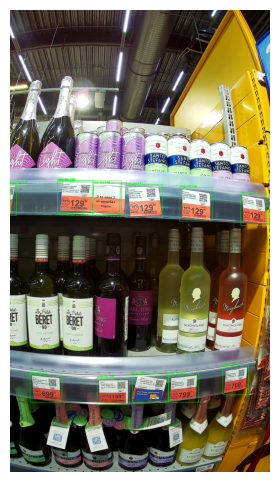

In [29]:
import cv2
import matplotlib.pyplot as plt

res = results[0]
img = res.orig_img.copy()

boxes = res.boxes

for box in boxes:
    print(box)
    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
    conf = box.conf[0].cpu().numpy()
    cls = int(box.cls[0])

    cv2.rectangle(
        img,
        (int(x1), int(y1)),
        (int(x2), int(y2)),
        (0, 255, 0),
        2
    )

    cv2.putText(
        img,
        f"{res.names[cls]} {conf:.2f}",
        (int(x1), int(y1) - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 255, 0),
        2
    )

plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

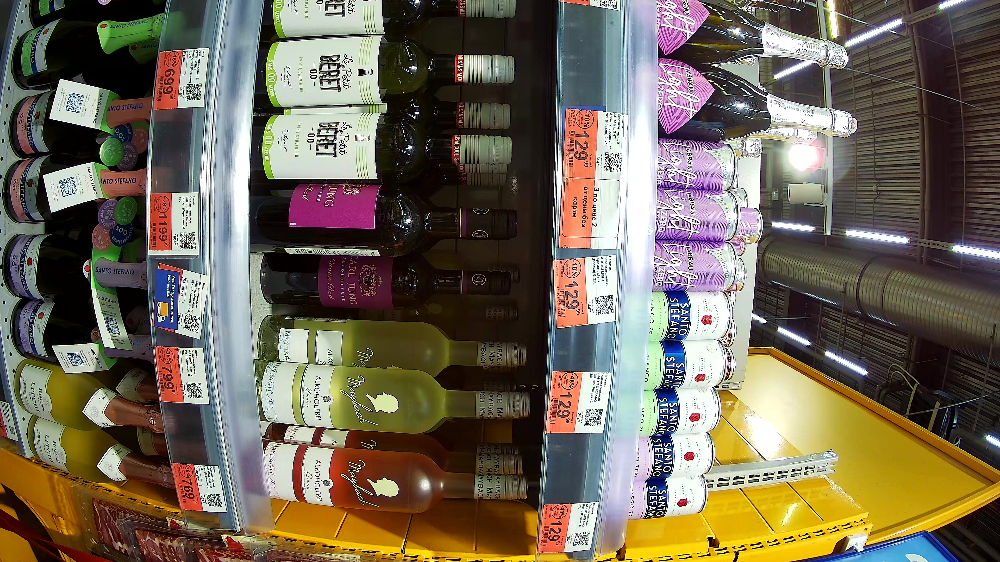

In [19]:
from PIL import Image
Image.open('/kaggle/working/runs/detect/predict/image0.jpg')

### VL model recognition

In [ ]:
!pip list | grep torchao

In [ ]:
!pip install -U torchao

In [ ]:
!pip install -U bitsandbytes>=0.46.1

In [ ]:
import torch
print(torch.cuda.get_device_name(0))
print(torch.cuda.get_device_capability(0))

In [1]:
from transformers import AutoProcessor, AutoModelForImageTextToText
from peft import PeftModel
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


base_id = "Qwen/Qwen3-VL-8B-Instruct"
lora_id = "openfoodfacts/price-tag-extractor"

processor = AutoProcessor.from_pretrained(base_id)

max_memory = {
    0: "14GiB",
    1: "14GiB",
    "cpu": "30GiB"
}

base_model = AutoModelForImageTextToText.from_pretrained(
    base_id,
    torch_dtype=torch.float16,
    device_map="auto",
    max_memory=max_memory
)

model = PeftModel.from_pretrained(
    base_model,
    lora_id,
    autocast_adapter_dtype=False
)

model.eval()

Skipping import of cpp extensions due to incompatible torch version. Please upgrade to torch >= 2.11.0 (found 2.10.0+cu128).
`torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/750 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/269 [00:00<?, ?B/s]

PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): Qwen3VLForConditionalGeneration(
      (model): Qwen3VLModel(
        (visual): Qwen3VLVisionModel(
          (patch_embed): Qwen3VLVisionPatchEmbed(
            (proj): Conv3d(3, 1152, kernel_size=(2, 16, 16), stride=(2, 16, 16))
          )
          (pos_embed): Embedding(2304, 1152)
          (rotary_pos_emb): Qwen3VLVisionRotaryEmbedding()
          (blocks): ModuleList(
            (0-26): 27 x Qwen3VLVisionBlock(
              (norm1): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
              (norm2): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
              (attn): Qwen3VLVisionAttention(
                (qkv): Linear(in_features=1152, out_features=3456, bias=True)
                (proj): Linear(in_features=1152, out_features=1152, bias=True)
              )
              (mlp): Qwen3VLVisionMLP(
                (linear_fc1): Linear(in_features=1152, out_features=4304, bias=True)
               

In [2]:
model.device

device(type='cuda', index=0)

In [3]:
import requests
import json
config = requests.get(
        "https://huggingface.co/datasets/openfoodfacts/price-tag-extraction/resolve/v1.1/config.json",
).json()
json_schema = config["json_schema"]
instructions = config["instructions"]
json_schema_str = json.dumps(json_schema)
full_instructions = f"{instructions}\n\nResponse must be formatted as JSON, and follow this JSON schema:\n{json_schema_str}"

In [6]:
from PIL import Image

image = Image.open(f"{working_dir}/Доступно участникам/Данные/25_12-20/crops/000001_270122724887.jpg")

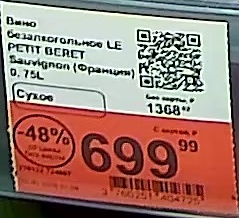

In [7]:
image

In [10]:
messages = [{
    "role": "user",
    "content": [
        {"type": "image", "image": image},
        {"type": "text", "text": "Extract price tag info as JSON."}
    ]
}]

# Step 1: build prompt
prompt = processor.apply_chat_template(
    messages,
    add_generation_prompt=True
)

# Step 2: tokenize
inputs = processor(
    text=[prompt],
    images=[image],
    return_tensors="pt"
)

# Step 3: move tensors
inputs = {k: v.to(model.device) for k, v in inputs.items()}

# Step 4: generate
with torch.no_grad():
    output = model.generate(
        **inputs,
        max_new_tokens=512,
    )

print(processor.decode(output[0], skip_special_tokens=True))

user
Extract price tag info as JSON.
assistant
{"product_name":"Вино безалкогольное LE PETIT BERTET Sauvignon (Франция)","volume":"0.75L","category":"Сухое","price":"699.99","discount":"48%","original_price":"1398.0","currency":"RUB"}
